# **Name: Shristina Prajapati**
# **UID: 2330706**

# **6CS012-Artificial Intelligence and Machine Learning**

# **Image Classificaiton with CNN**

In [ ]:
# importing required libraries
import random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import shutil
from PIL import Image, UnidentifiedImageError
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from sklearn.model_selection import train_test_split
import json
from pathlib import Path

2025-04-23 05:37:21.689421: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745386641.928884      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745386641.999517      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from sklearn.model_selection import train_test_split
import shutil
from PIL import Image
import random

In [ ]:
# set random seeds for reproducibility
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)


In [4]:
original_path = '/kaggle/input/sign-language/Sign Language Detection/Train'
train_dir = '/kaggle/working/sign-language/Sign Language Detection/Train'
if os.path.exists(train_dir):
    shutil.rmtree(train_dir)
shutil.copytree(original_path,train_dir)

'/kaggle/working/sign-language/Sign Language Detection/Train'

In [ ]:
#defining a new directory to store only validation images
val_dir = '/kaggle/working/sign-language/Sign Language Detection/Validation'
# defining a new directory to store only test images
test_dir = '/kaggle/working/sign-language/Sign Language Detection/SplitTest'
# deining where selected classes will be copied
selected_classes_dir = '/kaggle/working/sign-language/Sign Language Detection/SelectedClasses'  

In [6]:
img_height, img_width = 224, 224
min_images_per_class = 1000

In [ ]:
# creating the directories defined above
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)
os.makedirs(selected_classes_dir, exist_ok=True)

# Task 1: **Data Understanding**

### • How many total images are in the dataset?
### • How balanced is your dataset?i.e. image per class or label
### • How is your data distributed among train, valid and test set? If not How will you split the dataset among aforementioned folder.

# • How many total images are in the dataset?

In [ ]:
# How many total images are in the dataset?
print("\nData Analysis:")

image_paths = []
for p in Path(train_dir).rglob("*.*"):
    if p.suffix.lower() in ['.jpg', '.jpeg', '.png', '.bmp']:
        image_paths.append(str(p))

total_images = len(image_paths)
print(f"Total number of images in the dataset: {total_images}")


Data Analysis:
Total number of images in the dataset: 11058


# • How balanced is your dataset?i.e. image per class or label


In [ ]:
# How balanced is the dataset?
class_counts = {}
for root, dirs, files in os.walk(train_dir):
    class_name = os.path.basename(root)
    num_images = len([f for f in files if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))])
    if num_images > 0 and class_name not in ['Train', 'Test', 'Valid']:
        class_counts[class_name] = num_images

print("\nClass-wise image counts:")
for class_name, count in class_counts.items():
    print(f"{class_name}: {count} images")


Class-wise image counts:
16: 298 images
14: 277 images
1: 294 images
35: 286 images
15: 294 images
31: 295 images
28: 291 images
37: 296 images
33: 295 images
2: 298 images
22: 300 images
4: 246 images
11: 291 images
24: 297 images
30: 292 images
8: 297 images
19: 295 images
10: 298 images
32: 288 images
29: 292 images
9: 292 images
17: 293 images
3: 286 images
20: 293 images
6: 291 images
23: 292 images
12: 284 images
34: 290 images
13: 286 images
26: 292 images
0: 293 images
25: 294 images
27: 293 images
18: 294 images
36: 289 images
21: 293 images
5: 294 images
7: 289 images


In [ ]:
# listing available classes
class_dirs = os.listdir(train_dir)
print("Available classes:", class_dirs)



Available classes: ['16', '14', '1', '35', '15', '31', '28', '37', '33', '2', '22', '4', '11', '24', '30', '8', '19', '10', '32', '29', '9', '17', '3', '20', '6', '23', '12', '34', '13', '26', '0', '25', '27', '18', '36', '21', '5', '7']


In [ ]:
# function to verify and clean corrupt images
def verify_images(directory):
    print("Verifying images for corruption...")
    for class_name in os.listdir(directory):
        class_path = os.path.join(directory, class_name)
        if not os.path.isdir(class_path):
            continue
        for img_name in os.listdir(class_path):
            img_path = os.path.join(class_path, img_name)
            try:
                img = Image.open(img_path)
                img.verify()  
                img.close()
                # reopening to check if it can be loaded as an array
                img = load_img(img_path)
                img.close()
            except Exception as e:
                print(f"Removing corrupt image: {img_path} ({e})")
                os.remove(img_path)

In [ ]:
# function to select 10 classes (3 fixed + 7 random)
def select_classes(source_dir, target_dir, fixed_classes=['0', '14', '29']):
    print("Selecting 10 classes...")
    class_dirs = [d for d in os.listdir(source_dir) if os.path.isdir(os.path.join(source_dir, d))]
    
    # check if fixed classes exist
    for cls in fixed_classes:
        if cls not in class_dirs:
            raise ValueError(f"Class '{cls}' not found in {source_dir}.")
    
    # remove fixed classes from the pool
    remaining_classes = [cls for cls in class_dirs if cls not in fixed_classes]
    
    # randomly select 7 more classes
    random_classes = random.sample(remaining_classes, 7)
    
    # combining fixed and random classes
    selected_classes = fixed_classes + random_classes
    print("Selected classes:", selected_classes)
    
    # copyed selected class directories to target_dir
    for cls in selected_classes:
        src_path = os.path.join(source_dir, cls)
        dst_path = os.path.join(target_dir, cls)
        if os.path.exists(src_path):
            shutil.copytree(src_path, dst_path, dirs_exist_ok=True)
        else:
            print(f"Class {cls} not found at {src_path}. Skipping.")
    
    return selected_classes

# How is your data distributed among train, valid and test set? If not How will you split the dataset among aforementioned folder.

In [ ]:
# function to split dataset into train, validation, and test sets
def split_dataset(source_dir, val_dir, test_dir, train_split=0.7, val_split=0.2):
    print("Splitting dataset...")
    for class_name in os.listdir(source_dir):
        class_path = os.path.join(source_dir, class_name)
        if not os.path.isdir(class_path):
            continue

        # getting all image files
        images = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]
        if not images:
            print(f"No images found in class {class_name}. Skipping.")
            continue

        # splitting images
        train_images, temp_images = train_test_split(images, train_size=train_split, random_state=42)
        val_split_ratio = val_split / (val_split + 0.1)  # adjust for remaining 30%
        val_images, test_images = train_test_split(temp_images, train_size=val_split_ratio, random_state=42)

        print(f"Class {class_name}: Train={len(train_images)}, Val={len(val_images)}, Test={len(test_images)}")

        # creating class directories in validation and test sets
        os.makedirs(os.path.join(val_dir, class_name), exist_ok=True)
        os.makedirs(os.path.join(test_dir, class_name), exist_ok=True)

        # move validation images
        for img in val_images:
            src = os.path.join(class_path, img)
            dst = os.path.join(val_dir, class_name, img)
            shutil.move(src, dst)

        # move test images
        for img in test_images:
            src = os.path.join(class_path, img)
            dst = os.path.join(test_dir, class_name, img)
            shutil.move(src, dst)

# • Did you use any augmentations or not if yes visualize one image per augmentations style you have used?

In [ ]:
# function to augment training data to reach min_images_per_class
def augment_data_to_disk(source_dir, min_per_class=1000):
    print("Augmenting training data...")
    datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )

    for class_name in os.listdir(source_dir):
        class_path = os.path.join(source_dir, class_name)
        if not os.path.isdir(class_path):
            continue

        # count existing images
        existing_files = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]
        num_existing = len(existing_files)
        print(f"Class {class_name}: {num_existing} images")

        if num_existing >= min_per_class:
            print(f"Class {class_name} already has {num_existing} images. Skipping.")
            continue

        num_to_generate = min_per_class - num_existing
        print(f"Generating {num_to_generate} additional images for {class_name}")

        # load a batch of images
        image_files = [os.path.join(class_path, f) for f in existing_files]
        images_to_augment = []
        for img_path in image_files[:min(100, len(image_files))]:  # Use up to 100 source images
            try:
                img = load_img(img_path, target_size=(img_height, img_width))
                img_array = img_to_array(img)
                images_to_augment.append(img_array)
            except Exception as e:
                print(f"Error loading {img_path}: {e}")

        if not images_to_augment:
            print(f"No valid images in class {class_name}. Skipping.")
            continue

        images_to_augment = np.array(images_to_augment)
        aug_iter = datagen.flow(
            images_to_augment,
            batch_size=len(images_to_augment),
            save_to_dir=class_path,
            save_prefix=f'aug_{class_name}',
            save_format='jpg'
        )

        print(f"Augmenting class {class_name} until it has {min_per_class} images...")
        while True:
            next(aug_iter)
            current_count = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])
            if current_count >= min_per_class:
                print(f"{class_name} has now {current_count} images.")
                break


In [ ]:
# function to count images per class
def count_images(directory):
    counts = {}
    for class_name in os.listdir(directory):
        class_path = os.path.join(directory, class_name)
        if os.path.isdir(class_path):
            counts[class_name] = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])
    return counts

In [ ]:
# main preprocessing pipeline
def main():
    working_dir = train_dir  

    # verifying and clean corrupt images in Train directory
    verify_images(working_dir)

    # checking if class selection is needed
    class_dirs = [d for d in os.listdir(working_dir) if os.path.isdir(os.path.join(working_dir, d))]
    if len(class_dirs) > 10:
        print(f"Found {len(class_dirs)} classes. Selecting 10 classes...")
        select_classes(working_dir, selected_classes_dir, fixed_classes=['0', '14', '29'])
        working_dir = selected_classes_dir  # Update to selected classes directory
    else:
        print(f"Found {len(class_dirs)} classes. Assuming these are the selected classes.")

    # counting initial images per class
    print("Initial image counts:", count_images(working_dir))

    # spliting dataset
    split_dataset(working_dir, val_dir, test_dir, train_split=0.7, val_split=0.2)

    # count images after splitting
    print("Training image counts:", count_images(working_dir))
    print("Validation image counts:", count_images(val_dir))
    print("Test image counts:", count_images(test_dir))

    # augment training data
    augment_data_to_disk(working_dir, min_per_class=min_images_per_class)

    # final training image counts
    print("Final training image counts:", count_images(working_dir))

    # setting up data generators for verification
    train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=20,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.1,
        zoom_range=0.1,
        horizontal_flip=True,
        fill_mode='nearest'
    )

    val_test_datagen = ImageDataGenerator(rescale=1./255)

    train_generator = train_datagen.flow_from_directory(
        working_dir,
        target_size=(img_height, img_width),
        batch_size=32,
        class_mode='sparse',
        seed=42
    )

    val_generator = val_test_datagen.flow_from_directory(
        val_dir,
        target_size=(img_height, img_width),
        batch_size=32,
        class_mode='sparse',
        shuffle=False,
        seed=42
    )

    test_generator = val_test_datagen.flow_from_directory(
        test_dir,
        target_size=(img_height, img_width),
        batch_size=32,
        class_mode='sparse',
        shuffle=False,
        seed=42
    )

    print("Class indices:", train_generator.class_indices)

In [17]:
if __name__ == "__main__":
    main()

Verifying images for corruption...
Removing corrupt image: /kaggle/working/sign-language/Sign Language Detection/Train/16/IMG_20180607_113024.jpg (cannot identify image file '/kaggle/working/sign-language/Sign Language Detection/Train/16/IMG_20180607_113024.jpg')
Removing corrupt image: /kaggle/working/sign-language/Sign Language Detection/Train/16/IMG_20180605_125140.jpg (cannot identify image file '/kaggle/working/sign-language/Sign Language Detection/Train/16/IMG_20180605_125140.jpg')
Removing corrupt image: /kaggle/working/sign-language/Sign Language Detection/Train/16/IMG_20180709_092356.jpg (cannot identify image file '/kaggle/working/sign-language/Sign Language Detection/Train/16/IMG_20180709_092356.jpg')
Removing corrupt image: /kaggle/working/sign-language/Sign Language Detection/Train/16/IMG_20180704_212019.jpg (cannot identify image file '/kaggle/working/sign-language/Sign Language Detection/Train/16/IMG_20180704_212019.jpg')
Removing corrupt image: /kaggle/working/sign-lang

In [18]:
import os

print("Image count per class:\n")

for class_name in sorted(os.listdir(selected_classes_dir)):
    class_path = os.path.join(selected_classes_dir, class_name)
    if not os.path.isdir(class_path):
        continue

    image_files = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]
    count = len(image_files)
    print(f"{class_name}: {count} images")


Image count per class:

0: 1099 images
1: 1000 images
14: 1089 images
19: 1001 images
23: 1099 images
29: 1099 images
31: 1001 images
32: 1096 images
33: 1001 images
7: 1097 images


In [19]:
image_counts = {}

for class_name in sorted(os.listdir(selected_classes_dir)):
    class_path = os.path.join(selected_classes_dir, class_name)
    if not os.path.isdir(class_path):
        continue

    image_files = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]
    image_counts[class_name] = len(image_files)

# get min and max values
min_class = min(image_counts, key=image_counts.get)
max_class = max(image_counts, key=image_counts.get)

print(f"Class with minimum images: {min_class} ({image_counts[min_class]} images)")
print(f"Class with maximum images: {max_class} ({image_counts[max_class]} images)")


Class with minimum images: 1 (1000 images)
Class with maximum images: 0 (1099 images)


In [20]:
# initialize a set to store unique sizes
image_sizes = set()

# loop through all files in the directory
for root, dirs, files in os.walk(selected_classes_dir):
    for file in files:
        if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp')):
            img_path = os.path.join(root, file)
            try:
                with Image.open(img_path) as img:
                    image_sizes.add(img.size)  # (width, height)
            except Exception as e:
                print(f"Error processing {img_path}: {e}")

# print all unique image sizes
print("Unique image sizes in the directory:")
for size in image_sizes:
    print(f"- {size[0]}x{size[1]}")

Unique image sizes in the directory:
- 224x224


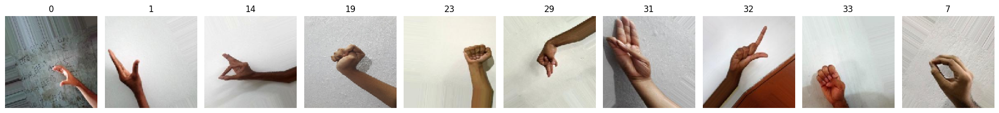

In [ ]:
import random
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img

img_size = (150, 150)  

class_folders = [d for d in sorted(os.listdir(selected_classes_dir)) if os.path.isdir(os.path.join(selected_classes_dir, d))]

fig, axes = plt.subplots(1, len(class_folders), figsize=(20, 5))

for i, class_name in enumerate(class_folders):
    class_path = os.path.join(selected_classes_dir, class_name)
    image_files = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]

    if image_files:
        sample_img_path = os.path.join(class_path, random.choice(image_files))
        img = load_img(sample_img_path, target_size=img_size)
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(class_name)
    else:
        axes[i].set_title(f"{class_name}\n(No images)")
        axes[i].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
def check_corrupted_images(directory):
    corrupted_files = []
    total_files = 0
    
    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                total_files += 1
                file_path = os.path.join(root, file)
                try:
                    with Image.open(file_path) as img:
                        img.verify()  # this checks for corruption
                except Exception as e:
                    corrupted_files.append((file_path, str(e)))
    
    print(f"Checked {total_files} images in: {directory}")
    if corrupted_files:
        print(f"Found {len(corrupted_files)} corrupted images:")
        for file_path, error in corrupted_files:
            print(f"- {file_path} | Error: {error}")
    else:
        print("No corrupted images found ")


# Run the check
check_corrupted_images(test_dir)
check_corrupted_images(val_dir)


Checked 288 images in: /kaggle/working/sign-language/Sign Language Detection/SplitTest
No corrupted images found 
Checked 569 images in: /kaggle/working/sign-language/Sign Language Detection/Validation
No corrupted images found 


# Task 2: Building Fully Connected Neural Network.<br>
# **Model Building:**

# **Baseline CNN Model**

In [23]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Input
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt


In [ ]:
# paths
train_dir = '/kaggle/working/sign-language/Sign Language Detection/SelectedClasses'
val_dir = '/kaggle/working/sign-language/Sign Language Detection/Validation'
test_dir = '/kaggle/working/sign-language/Sign Language Detection/SplitTest'

# image parameters
img_height, img_width = 224, 224
batch_size = 32
num_classes = 10

# data generators
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

val_test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='sparse',
    seed=42
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='sparse',
    shuffle=False,
    seed=42
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='sparse',
    shuffle=False,
    seed=42
)
input_shape=(224, 224, 3)


Found 10582 images belonging to 10 classes.
Found 569 images belonging to 10 classes.
Found 288 images belonging to 10 classes.


In [ ]:
# baseline CNN model
model = Sequential([
    Input(shape = input_shape),
    # conv layer 1
    Conv2D(32, (3, 3), padding='same', activation='relu'),
    MaxPooling2D((2, 2)),
    # conv layer 2
    Conv2D(64, (3, 3), padding='same', activation='relu'),
    MaxPooling2D((2, 2)),
    # conv layer 3
    Conv2D(128, (3, 3), padding='same', activation='relu'),
    MaxPooling2D((2, 2)),
    # flatten
    Flatten(),
    # FCN 1
    Dense(512, activation='relu'),
    # FCN 2
    Dense(256, activation='relu'),
    # FCN 3
    Dense(128, activation='relu'),
    # output layer
    Dense(num_classes, activation='softmax')
])

# baseline model summary
model.summary()

# compiling the model
model.compile(optimizer=Adam(learning_rate=1e-3), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# train the model
history = model.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    ]
)

# evaluating on test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Baseline Model - Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

# detailed metrics
test_predictions = model.predict(test_generator)
test_pred_labels = np.argmax(test_predictions, axis=1)
test_true_labels = test_generator.classes
print("\nBaseline Model Classification Report:")
print(classification_report(test_true_labels, test_pred_labels, target_names=list(test_generator.class_indices.keys())))

model.save('baseline_cnn.h5')

I0000 00:00:1745387195.617348      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1745387195.618011      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 100352)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │      51,380,736 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 10)                  │           1,290 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 51,639,498 (196.99 MB)

 Trainable params: 51,639,498 (196.99 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1745387204.160274     140 service.cc:148] XLA service 0x7f18a8005960 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1745387204.161302     140 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1745387204.161324     140 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1745387204.537823     140 cuda_dnn.cc:529] Loaded cuDNN version 90300


  2/331 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - accuracy: 0.1719 - loss: 3.0165   

I0000 00:00:1745387209.907256     140 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


331/331 ━━━━━━━━━━━━━━━━━━━━ 120s 329ms/step - accuracy: 0.1403 - loss: 2.3248 - val_accuracy: 0.3040 - val_loss: 1.9119
Epoch 2/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 105s 311ms/step - accuracy: 0.2985 - loss: 1.8724 - val_accuracy: 0.5395 - val_loss: 1.2408
Epoch 3/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 104s 308ms/step - accuracy: 0.4897 - loss: 1.3203 - val_accuracy: 0.5501 - val_loss: 1.1475
Epoch 4/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 103s 305ms/step - accuracy: 0.5856 - loss: 1.0592 - val_accuracy: 0.7223 - val_loss: 0.7803
Epoch 5/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 104s 308ms/step - accuracy: 0.6592 - loss: 0.8834 - val_accuracy: 0.7329 - val_loss: 0.6923
Epoch 6/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 104s 308ms/step - accuracy: 0.6998 - loss: 0.7628 - val_accuracy: 0.7522 - val_loss: 0.6863
Epoch 7/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 103s 305ms/step - accuracy: 0.7340 - loss: 0.6881 - val_accuracy: 0.8049 - val_loss: 0.5815
Epoch 8/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 104s 307ms/step - accuracy: 0.7707 - loss: 0.59

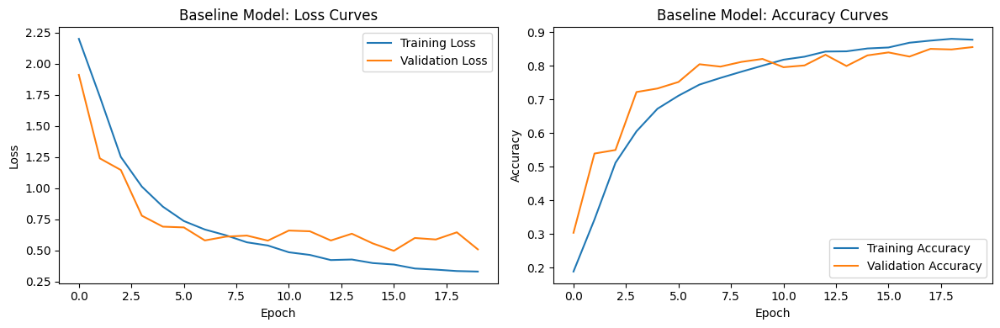

In [ ]:
# plot training and validation loss
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Baseline Model: Loss Curves')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()


# plotting training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Baseline Model: Accuracy Curves')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.tight_layout()
plt.savefig('baseline_loss_accuracy.png')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


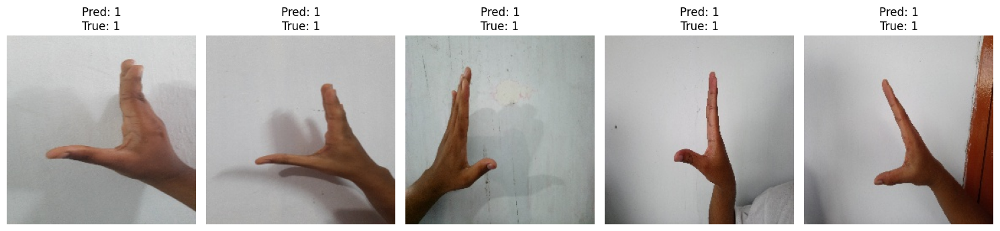

In [ ]:
loaded_model = tf.keras.models.load_model('baseline_cnn.h5')

# inference on sample test images
sample_images, sample_labels = next(test_generator)
sample_predictions = loaded_model.predict(sample_images)
sample_pred_labels = np.argmax(sample_predictions, axis=1)
class_names = list(test_generator.class_indices.keys())

plt.figure(figsize=(15, 5))
for i in range(5):  
    plt.subplot(1, 5, i+1)
    plt.imshow(sample_images[i])
    plt.title(f"Pred: {class_names[sample_pred_labels[i]]}\nTrue: {class_names[int(sample_labels[i])]}")
    plt.axis('off')
plt.tight_layout()
plt.show()
plt.close()

Found 288 images belonging to 10 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


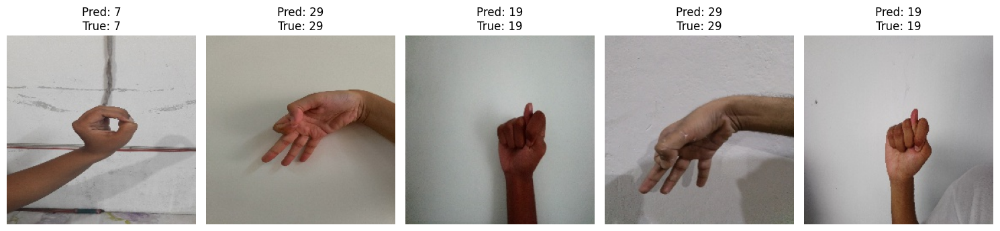

In [ ]:
import random

# shuffle the generator manually to pick more diverse data
test_generator_shuffled = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='sparse',
    shuffle=True,
    seed=None  
)

sample_images, sample_labels = next(test_generator_shuffled)

sample_predictions = loaded_model.predict(sample_images)
sample_pred_labels = np.argmax(sample_predictions, axis=1)
class_names = list(test_generator.class_indices.keys())

plt.figure(figsize=(15, 5))
for i in range(5): 
    plt.subplot(1, 5, i+1)
    plt.imshow(sample_images[i])
    plt.title(f"Pred: {class_names[sample_pred_labels[i]]}\nTrue: {class_names[int(sample_labels[i])]}")
    plt.axis('off')
plt.tight_layout()
plt.show()
plt.close()

# **Deeper CNN Model**

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, Activation, Input
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import SGD
import time


def build_model(input_shape, num_classes):
    model = Sequential([
        Input(shape=input_shape),
        
        # conv layer 1
        Conv2D(32, (3, 3), padding='same', kernel_regularizer=l2(1e-4)),
        BatchNormalization(momentum=0.95),
        Activation('relu'),
        MaxPooling2D((2, 2)),

        # conv layer 2
        Conv2D(64, (3, 3), padding='same', kernel_regularizer=l2(1e-4)),
        BatchNormalization(momentum=0.95),
        Activation('relu'),
        MaxPooling2D((2, 2)),

        # conv layer 3
        Conv2D(128, (3, 3), padding='same', kernel_regularizer=l2(1e-4)),
        BatchNormalization(momentum=0.95),
        Activation('relu'),
        MaxPooling2D((2, 2)),

        # conv layer 4
        Conv2D(256, (3, 3), padding='same', kernel_regularizer=l2(1e-4)),
        BatchNormalization(momentum=0.95),
        Activation('relu'),
        MaxPooling2D((2, 2)),

        # conv layer 5
        Conv2D(256, (3, 3), padding='same', kernel_regularizer=l2(1e-4)),
        BatchNormalization(momentum=0.95),
        Activation('relu'),
        MaxPooling2D((2, 2)),

        # conv layer 6
        Conv2D(512, (3, 3), padding='same', kernel_regularizer=l2(1e-4)),
        BatchNormalization(momentum=0.95),
        Activation('relu'),
        MaxPooling2D((2, 2)),

        # flatten and FCNs
        Flatten(),
        Dense(1024, activation='relu', kernel_regularizer=l2(1e-4)),
        Dropout(0.3),
        Dense(512, activation='relu', kernel_regularizer=l2(1e-4)),
        Dropout(0.3),
        Dense(512, activation='relu', kernel_regularizer=l2(1e-4)),
        Dense(256, activation='relu', kernel_regularizer=l2(1e-4)),
        Dense(256, activation='relu', kernel_regularizer=l2(1e-4)),
        Dense(128, activation='relu', kernel_regularizer=l2(1e-4)),
        Dense(num_classes, activation='softmax', kernel_regularizer=l2(1e-4))
    ])
    return model


In [ ]:
# function to train and evaluate with a given optimizer
def train_and_evaluate(optimizer, optimizer_name, input_shape, num_classes):
    print(f"\nTraining with {optimizer_name}...")
    
    # building a fresh model for each optimizer
    model = build_model(input_shape, num_classes)
    
    # compile the model
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    
    # training the model
    start_time = time.time()
    history = model.fit(
        train_generator,
        epochs=20,
        validation_data=val_generator,
        callbacks=[
            tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
            tf.keras.callbacks.ModelCheckpoint(f'deeper_cnn_{optimizer_name.lower()}.keras', monitor='val_accuracy', save_best_only=True)
        ]
    )
    training_time = time.time() - start_time
    
    # evaluating on test set
    test_loss, test_accuracy = model.evaluate(test_generator)
    print(f"Deeper Model ({optimizer_name}) - Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}, Training Time: {training_time:.2f} seconds")
    
    test_predictions = model.predict(test_generator)
    test_pred_labels = np.argmax(test_predictions, axis=1)
    test_true_labels = test_generator.classes
    print(f"\nDeeper Model ({optimizer_name}) Classification Report:")
    print(classification_report(test_true_labels, test_pred_labels, target_names=list(test_generator.class_indices.keys())))
    
    # plotting the loss and accuracy curves
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'Deeper Model ({optimizer_name}): Loss Curves')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'Deeper Model ({optimizer_name}): Accuracy Curves')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

    return test_loss, test_accuracy, training_time


# **Compile and Train with Adam**


Training with Adam...
Epoch 1/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 131s 341ms/step - accuracy: 0.1377 - loss: 2.7545 - val_accuracy: 0.2847 - val_loss: 2.2564
Epoch 2/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 104s 307ms/step - accuracy: 0.3774 - loss: 1.8539 - val_accuracy: 0.4815 - val_loss: 1.5972
Epoch 3/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 106s 314ms/step - accuracy: 0.5100 - loss: 1.4770 - val_accuracy: 0.5501 - val_loss: 1.4291
Epoch 4/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 106s 314ms/step - accuracy: 0.5986 - loss: 1.2547 - val_accuracy: 0.6134 - val_loss: 1.2996
Epoch 5/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 105s 311ms/step - accuracy: 0.6679 - loss: 1.0950 - val_accuracy: 0.6924 - val_loss: 1.0560
Epoch 6/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 105s 309ms/step - accuracy: 0.7213 - loss: 0.9923 - val_accuracy: 0.6960 - val_loss: 1.0303
Epoch 7/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 105s 309ms/step - accuracy: 0.7388 - loss: 0.9277 - val_accuracy: 0.7944 - val_loss: 0.9023
Epoch 8/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 105s 310ms/st

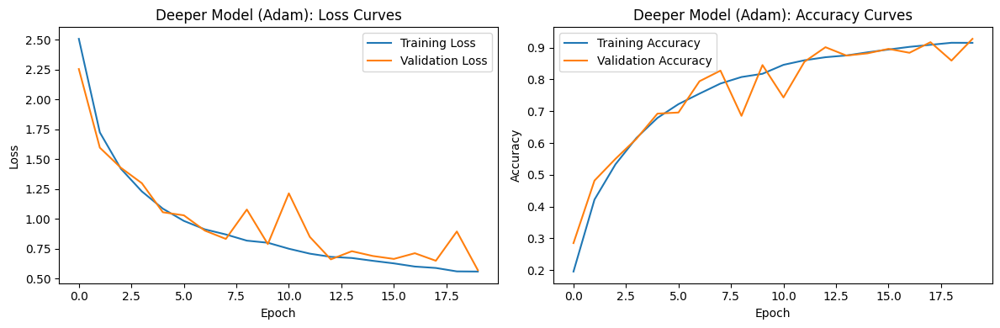

In [38]:
# training with Adam
adam_loss, adam_accuracy, adam_time = train_and_evaluate(Adam(learning_rate=1e-3), "Adam", (img_height, img_width, 3), num_classes)


Running inference on sample test images...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


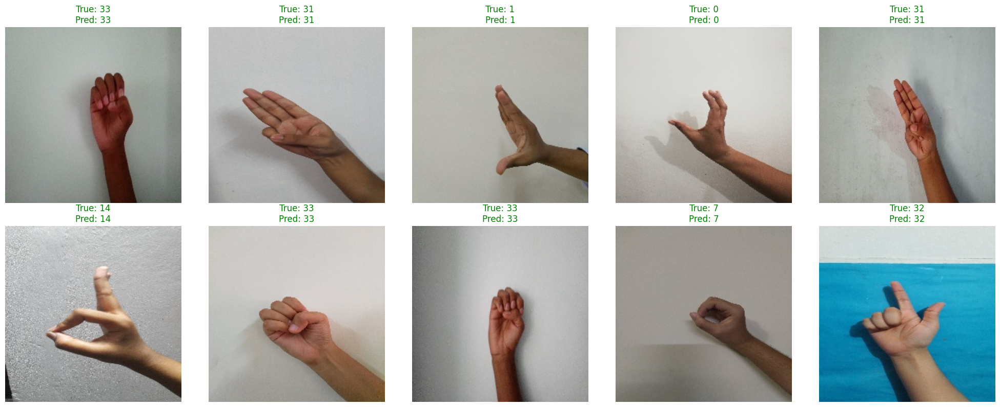

In [ ]:
from tensorflow.keras.preprocessing import image

# visualize inference on random test samples
def visualize_inference(model, generator, class_labels, num_images=10, save_path='inference_output.png'):
    print("\nRunning inference on sample test images...")

    # get a shuffled list of indices
    indices = list(range(len(generator.filenames)))
    random.shuffle(indices)

    # create a batch of selected images and true labels
    selected_images = []
    true_labels = []
    for i in indices[:num_images]:
        img_path = os.path.join(generator.directory, generator.filenames[i])
        img = image.load_img(img_path, target_size=(img_height, img_width))
        img_array = image.img_to_array(img) / 255.0  # Normalize like in generator
        selected_images.append(img_array)
        true_labels.append(generator.classes[i])

    selected_images = np.array(selected_images)
    predictions = model.predict(selected_images)
    predicted_labels = np.argmax(predictions, axis=1)

    # plot results
    plt.figure(figsize=(20, 8))
    for i in range(num_images):
        plt.subplot(2, 5, i+1)
        plt.imshow(selected_images[i])
        true_name = class_labels[true_labels[i]]
        pred_name = class_labels[predicted_labels[i]]
        color = 'green' if true_labels[i] == predicted_labels[i] else 'red'
        plt.title(f"True: {true_name}\nPred: {pred_name}", color=color)
        plt.axis('off')
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

# get class label list from the generator
class_labels = list(test_generator.class_indices.keys())

# use the model trained with Adam optimizer
visualize_inference(model, test_generator, class_labels, num_images=10, save_path='inference_output.png')


# **Compile and Train with SGD**


Training with SGD...
Epoch 1/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 120s 326ms/step - accuracy: 0.1530 - loss: 2.7002 - val_accuracy: 0.1617 - val_loss: 3.2874
Epoch 2/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 103s 304ms/step - accuracy: 0.3480 - loss: 2.0226 - val_accuracy: 0.5202 - val_loss: 1.5773
Epoch 3/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 108s 318ms/step - accuracy: 0.5005 - loss: 1.7099 - val_accuracy: 0.5571 - val_loss: 1.5569
Epoch 4/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 102s 301ms/step - accuracy: 0.5803 - loss: 1.4432 - val_accuracy: 0.4025 - val_loss: 2.0293
Epoch 5/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 103s 305ms/step - accuracy: 0.6120 - loss: 1.3384 - val_accuracy: 0.6749 - val_loss: 1.2964
Epoch 6/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 103s 303ms/step - accuracy: 0.6452 - loss: 1.2735 - val_accuracy: 0.7170 - val_loss: 1.1319
Epoch 7/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 103s 306ms/step - accuracy: 0.6990 - loss: 1.1682 - val_accuracy: 0.6995 - val_loss: 1.2518
Epoch 8/20
331/331 ━━━━━━━━━━━━━━━━━━━━ 105s 309ms/ste

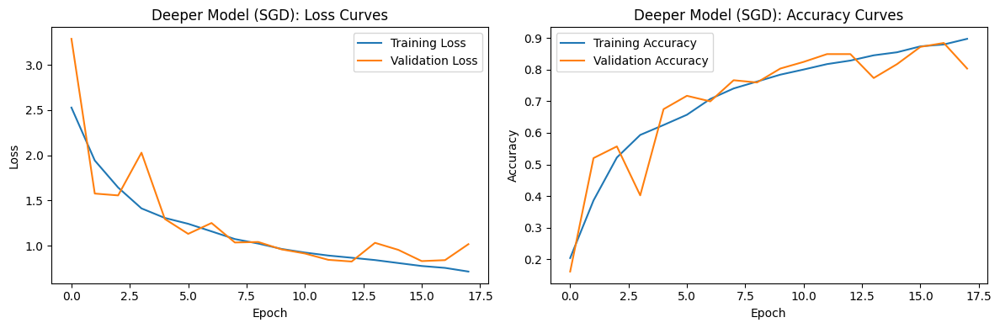

In [50]:
# training with SGD
sgd_loss, sgd_accuracy, sgd_time = train_and_evaluate(SGD(learning_rate=1e-2, momentum=0.9), "SGD", (img_height, img_width, 3), num_classes)


Running inference on sample test images...
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step


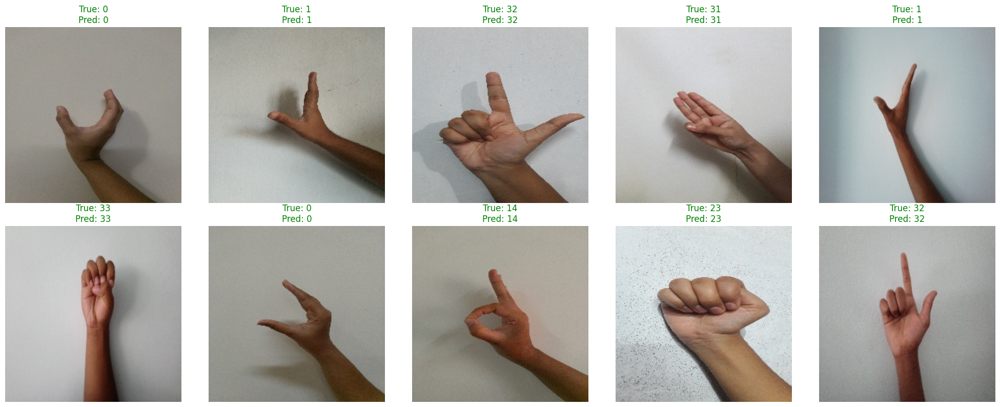

In [ ]:
from tensorflow.keras.models import load_model
sgd_model = load_model('deeper_cnn_sgd.keras')

# visualizing inference using the same function
visualize_inference(sgd_model, test_generator, class_labels, num_images=10, save_path='inference_sgd_output.png')


In [ ]:
# comparing the optimizers
print("\nOptimizer Comparison:")
print(f"Adam - Test Loss: {adam_loss:.4f}, Test Accuracy: {adam_accuracy:.4f}, Training Time: {adam_time:.2f} seconds")
print(f"SGD - Test Loss: {sgd_loss:.4f}, Test Accuracy: {sgd_accuracy:.4f}, Training Time: {sgd_time:.2f} seconds")


Optimizer Comparison:
Adam - Test Loss: 0.5997, Test Accuracy: 0.9271, Training Time: 2116.17 seconds
SGD - Test Loss: 0.8455, Test Accuracy: 0.8403, Training Time: 1887.53 seconds


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step


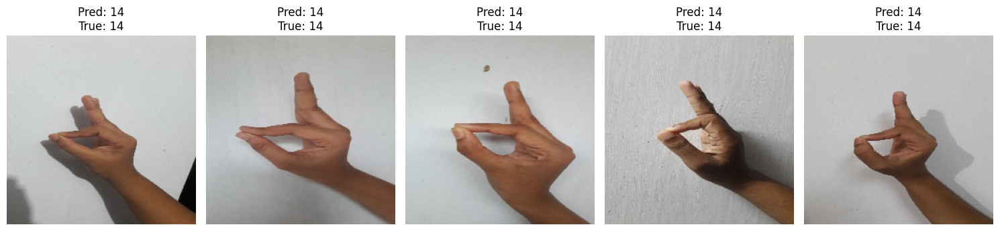

In [ ]:
# loading best model Adam or SGD based on test accuracy
best_model_file = 'deeper_cnn_adam.keras' if adam_accuracy >= sgd_accuracy else 'deeper_cnn_sgd.keras'
model = tf.keras.models.load_model(best_model_file)

# inference on sample test images
sample_images, sample_labels = next(test_generator)
sample_predictions = model.predict(sample_images)
sample_pred_labels = np.argmax(sample_predictions, axis=1)
class_names = list(test_generator.class_indices.keys())

plt.figure(figsize=(15, 5))
for i in range(5):
    plt.subplot(1, 5, i+1)
    plt.imshow(sample_images[i])
    plt.title(f"Pred: {class_names[sample_pred_labels[i]]}\nTrue: {class_names[int(sample_labels[i])]}")
    plt.axis('off')
plt.tight_layout()
plt.savefig('deeper_sample_predictions.png')
plt.show()
plt.close()

Found 288 images belonging to 10 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


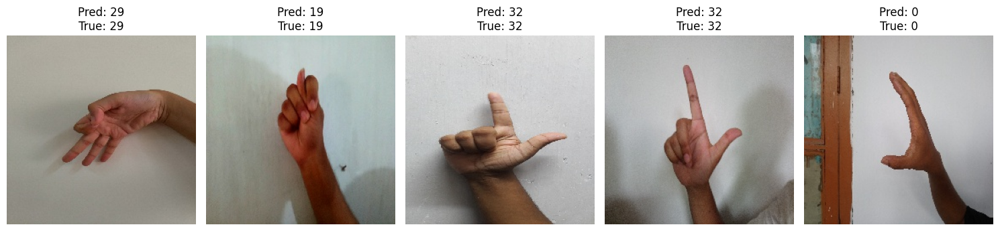

In [ ]:
# loading the best model Adam or SGD based on test accuracy
best_model_file = 'deeper_cnn_adam.keras' if adam_accuracy >= sgd_accuracy else 'deeper_cnn_sgd.keras'
model = tf.keras.models.load_model(best_model_file)

# inference on sample test images
import random

# shuffling the generator manually to pick more diverse data
test_generator_shuffled = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='sparse',
    shuffle=True,
    seed=None  # no fixed seed
)

sample_images, sample_labels = next(test_generator_shuffled)
sample_predictions = model.predict(sample_images)
sample_pred_labels = np.argmax(sample_predictions, axis=1)
class_names = list(test_generator.class_indices.keys())

plt.figure(figsize=(15, 5))
for i in range(5):
    plt.subplot(1, 5, i+1)
    plt.imshow(sample_images[i])
    plt.title(f"Pred: {class_names[sample_pred_labels[i]]}\nTrue: {class_names[int(sample_labels[i])]}")
    plt.axis('off')
plt.tight_layout()
plt.savefig('deeper_sample_predictions.png')
plt.show()
plt.close()

# **Transfer Learning**

# Using ResNet as pre-trained model

Model: "functional_297"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 24,641,930 (94.00 MB)

 Trainable params: 1,054,218 (4.02 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

Training with feature extraction...
Epoch 1/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 137s 359ms/step - accuracy: 0.1015 - loss: 2.3985 - val_accuracy: 0.0984 - val_loss: 2.3028
Epoch 2/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 108s 320ms/step - accuracy: 0.1022 - loss: 2.3010 - val_accuracy: 0.1002 - val_loss: 2.3030
Epoch 3/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 105s 311ms/step - accuracy: 0.1016 - loss: 2.3015 - val_accuracy: 0.0949 - val_loss: 2.3009
Epoch 4/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 109s 321ms/step - accuracy: 0.1063 - loss: 2.2967 - val_accuracy: 0.1178 - val_loss: 2.2933
Epoch 5/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 108s 319ms/step - accuracy: 0.1159 - loss: 2.2897 - val_accuracy: 0.1441 - val_loss: 2.2919
Epoch 6/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 106s 314ms/step - accuracy: 0.1176 - loss: 2.2844 - val_accuracy: 0.1371 - val_loss: 2.2846
Epoch 7/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 109s 324ms/step - accuracy: 0.1286 - loss: 2.2776 - val_accuracy: 0.1459 - val_loss: 2.2848
Epoch 8/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 

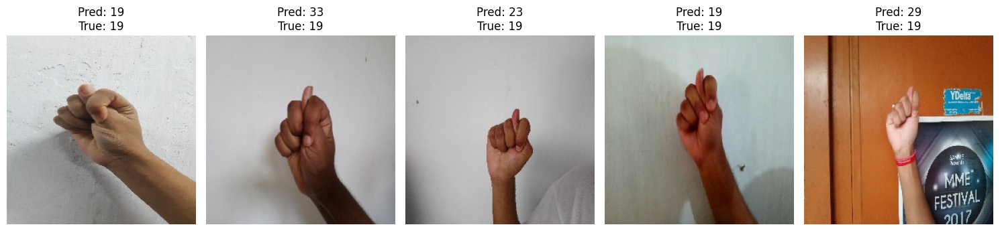

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout

import time

# loading ResNet50
base_model = ResNet50(
    weights='/kaggle/input/resnet/keras/default/1/resnet50_weights_tf_dim_ordering_tf_kernels_notop (1).h5',
    include_top=False,
    input_shape=(224, 224, 3)
)

base_model.trainable = False  # Freeze base model

# adding custom layers
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# model summary
model.summary()

# compiling model for feature extraction
model.compile(optimizer=Adam(learning_rate=1e-3), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# train model (feature extraction)
print("Training with feature extraction...")
start_time = time.time()
history_fe = model.fit(
    train_generator,
    epochs=10,
    validation_data=val_generator,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
        tf.keras.callbacks.ModelCheckpoint('resnet50_fe.keras', monitor='val_accuracy', save_best_only=True)
    ]
)
fe_time = time.time() - start_time

# fine-tuning
base_model.trainable = True
for layer in base_model.layers[:100]:  # Freeze first 100 layers
    layer.trainable = False

# recompile with lower learning rate
model.compile(optimizer=Adam(learning_rate=1e-5), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# train model (fine-tuning)
print("Training with fine-tuning...")
start_time = time.time()
history_ft = model.fit(
    train_generator,
    epochs=10,
    validation_data=val_generator,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
        tf.keras.callbacks.ModelCheckpoint('resnet50_ft.keras', monitor='val_accuracy', save_best_only=True)
    ]
)
ft_time = time.time() - start_time

# combine histories for plotting
history = {
    'loss': history_fe.history['loss'] + history_ft.history['loss'],
    'val_loss': history_fe.history['val_loss'] + history_ft.history['val_loss'],
    'accuracy': history_fe.history['accuracy'] + history_ft.history['accuracy'],
    'val_accuracy': history_fe.history['val_accuracy'] + history_ft.history['val_accuracy']
}

# evaluating on test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"ResNet50 - Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}, Total Training Time: {fe_time + ft_time:.2f} seconds")

# detailed metrics
test_predictions = model.predict(test_generator)
test_pred_labels = np.argmax(test_predictions, axis=1)
test_true_labels = test_generator.classes
print("\nResNet50 Classification Report:")
print(classification_report(test_true_labels, test_pred_labels, target_names=list(test_generator.class_indices.keys())))

model.save('resnet50_final.keras')

# inference on sample test images
sample_images, sample_labels = next(test_generator)
sample_predictions = model.predict(sample_images)
sample_pred_labels = np.argmax(sample_predictions, axis=1)
class_names = list(test_generator.class_indices.keys())

plt.figure(figsize=(15, 5))
for i in range(5):
    plt.subplot(1, 5, i+1)
    plt.imshow(sample_images[i])
    plt.title(f"Pred: {class_names[sample_pred_labels[i]]}\nTrue: {class_names[int(sample_labels[i])]}")
    plt.axis('off')
plt.tight_layout()
plt.savefig('resnet50_sample_predictions.png')
plt.show()
plt.close()

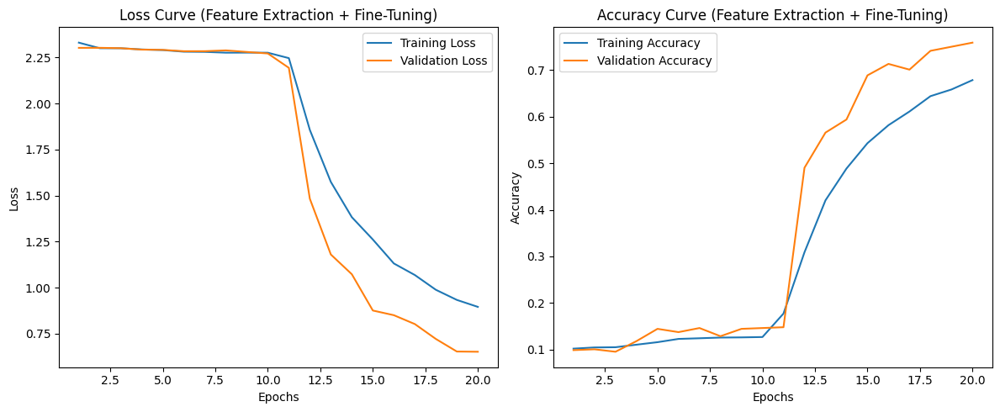

In [ ]:
import matplotlib.pyplot as plt

# number of total epochs
epochs = range(1, len(history['loss']) + 1)

# plotting Loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, history['loss'], label='Training Loss')
plt.plot(epochs, history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Curve (Feature Extraction + Fine-Tuning)')
plt.legend()

# plotting accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, history['accuracy'], label='Training Accuracy')
plt.plot(epochs, history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Curve (Feature Extraction + Fine-Tuning)')
plt.legend()

plt.tight_layout()
plt.savefig('resnet50_training_curves.png')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


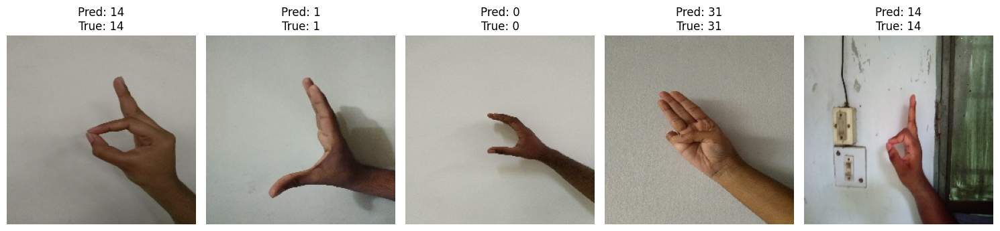

In [ ]:
# inference on sample test images
sample_images, sample_labels = next(test_generator_shuffled)
sample_predictions = model.predict(sample_images)
sample_pred_labels = np.argmax(sample_predictions, axis=1)
class_names = list(test_generator.class_indices.keys())

plt.figure(figsize=(15, 5))
for i in range(5):
    plt.subplot(1, 5, i+1)
    plt.imshow(sample_images[i])
    plt.title(f"Pred: {class_names[sample_pred_labels[i]]}\nTrue: {class_names[int(sample_labels[i])]}")
    plt.axis('off')
plt.tight_layout()
plt.savefig('resnet50_sample_predictions.png')
plt.show()
plt.close()

In [66]:
original = '/kaggle/input/sign-language/Sign Language Detection/Test'
testing = '/kaggle/working/sign-language/Sign Language Detection/Testing'
if os.path.exists(testing):
    shutil.rmtree(testing)
shutil.copytree(original,testing)

'/kaggle/working/sign-language/Sign Language Detection/Testing'

In [ ]:
# predicting original three test images 
def load_test_images(testing, img_height, img_width):
    test_images = []
    test_filenames = os.listdir(testing)
    for filename in test_filenames:
        img_path = os.path.join(testing, filename)
        img = tf.keras.preprocessing.image.load_img(img_path, target_size=(img_height, img_width))
        img_array = tf.keras.preprocessing.image.img_to_array(img) / 255.0
        test_images.append(img_array)
    return np.array(test_images), test_filenames

if os.path.exists(testing):
    test_images, test_filenames = load_test_images(testing, img_height, img_width)
    predictions = model.predict(test_images)
    pred_labels = np.argmax(predictions, axis=1)
    print("\nResNet50 Predictions on Original Test Images:")
    for filename, label in zip(test_filenames, pred_labels):
        print(f"Image: {filename}, Predicted: {class_names[label]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step

ResNet50 Predictions on Original Test Images:
Image: 20180701_194331.jpg, Predicted: 0
Image: 20180625_203333.jpg, Predicted: 31
Image: 20180625_230047.jpg, Predicted: 14


# Using Inception as pre-trained model

Model: "functional_298"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_15 (Conv2D)        │ (None, 111, 111, 32)   │            864 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_12    │ (None, 111, 111, 32)   │             96 │ conv2d_15[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_12             │ (None, 111, 111, 32)   │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_16 (Conv2D)        │ (None, 109, 109, 32)   │          9,216 │ activation_12[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_13    │ (None, 109, 109, 32)   │             96 │ conv2d_16[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_13             │ (None, 109, 109, 32)   │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_17 (Conv2D)        │ (None, 109, 109, 64)   │         18,432 │ activation_13[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_14    │ (None, 109, 109, 64)   │            192 │ conv2d_17[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_14             │ (None, 109, 109, 64)   │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_15          │ (None, 54, 54, 64)     │              0 │ activation_14[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_18 (Conv2D)        │ (None, 54, 54, 80)     │          5,120 │ max_pooling2d_15[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_15    │ (None, 54, 54, 80)     │            240 │ conv2d_18[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_15             │ (None, 54, 54, 80)     │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_19 (Conv2D)   

 Total params: 22,857,002 (87.19 MB)

 Trainable params: 1,054,218 (4.02 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

Training with feature extraction...
Epoch 1/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 148s 381ms/step - accuracy: 0.4865 - loss: 1.5016 - val_accuracy: 0.7715 - val_loss: 0.6052
Epoch 2/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 110s 325ms/step - accuracy: 0.6947 - loss: 0.7989 - val_accuracy: 0.7961 - val_loss: 0.5897
Epoch 3/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 107s 318ms/step - accuracy: 0.7230 - loss: 0.7245 - val_accuracy: 0.8172 - val_loss: 0.4772
Epoch 4/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 107s 316ms/step - accuracy: 0.7276 - loss: 0.7053 - val_accuracy: 0.8155 - val_loss: 0.4913
Epoch 5/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 107s 317ms/step - accuracy: 0.7650 - loss: 0.6252 - val_accuracy: 0.8330 - val_loss: 0.4442
Epoch 6/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 107s 316ms/step - accuracy: 0.7742 - loss: 0.5920 - val_accuracy: 0.8295 - val_loss: 0.4205
Epoch 7/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 108s 320ms/step - accuracy: 0.7813 - loss: 0.5729 - val_accuracy: 0.8436 - val_loss: 0.4142
Epoch 8/10
331/331 ━━━━━━━━━━━━━━━━━━━━ 

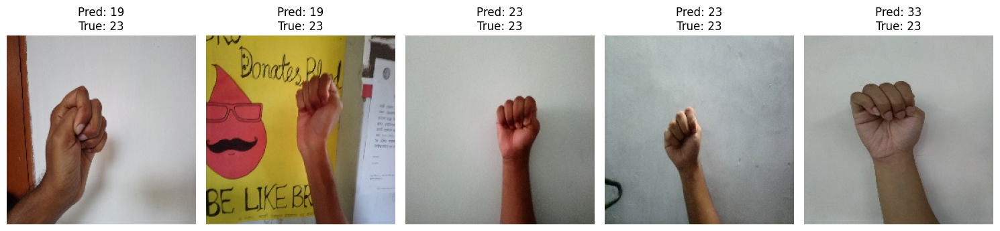

In [ ]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
import numpy as np
import time
import tensorflow as tf

base_model = InceptionV3(
    weights='/kaggle/input/inceptionv1/keras/default/1/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5',
    include_top=False,
    input_shape=(224, 224, 3)
)


base_model.trainable = False  # freezing base model

# adding custom layers
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Model summary
model.summary()

# compiling model for feature extraction
model.compile(optimizer=Adam(learning_rate=1e-3), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# training model (feature extraction)
print("Training with feature extraction...")
start_time = time.time()
history_fe = model.fit(
    train_generator,
    epochs=10,
    validation_data=val_generator,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
        tf.keras.callbacks.ModelCheckpoint('inceptionv3_fe.keras', monitor='val_accuracy', save_best_only=True)
    ]
)
fe_time = time.time() - start_time

# fine-tuning
base_model.trainable = True
for layer in base_model.layers[:100]:  # Freeze first 100 layers
    layer.trainable = False

# recompile with lower learning rate
model.compile(optimizer=Adam(learning_rate=1e-5), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# training the model (fine-tuning)
print("Training with fine-tuning...")
start_time = time.time()
history_ft = model.fit(
    train_generator,
    epochs=10,
    validation_data=val_generator,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
        tf.keras.callbacks.ModelCheckpoint('inceptionv3_ft.keras', monitor='val_accuracy', save_best_only=True)
    ]
)
ft_time = time.time() - start_time

# combining histories for plotting
history = {
    'loss': history_fe.history['loss'] + history_ft.history['loss'],
    'val_loss': history_fe.history['val_loss'] + history_ft.history['val_loss'],
    'accuracy': history_fe.history['accuracy'] + history_ft.history['accuracy'],
    'val_accuracy': history_fe.history['val_accuracy'] + history_ft.history['val_accuracy']
}

# evaluating on test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"InceptionV3 - Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}, Total Training Time: {fe_time + ft_time:.2f} seconds")

# detailed metrics
test_predictions = model.predict(test_generator)
test_pred_labels = np.argmax(test_predictions, axis=1)
test_true_labels = test_generator.classes
print("\nInceptionV3 Classification Report:")
print(classification_report(test_true_labels, test_pred_labels, target_names=list(test_generator.class_indices.keys())))

# saving the final model
model.save('inceptionv3_final.keras')

# inference on sample test images
sample_images, sample_labels = next(test_generator)
sample_predictions = model.predict(sample_images)
sample_pred_labels = np.argmax(sample_predictions, axis=1)
class_names = list(test_generator.class_indices.keys())

plt.figure(figsize=(15, 5))
for i in range(5):
    plt.subplot(1, 5, i+1)
    plt.imshow(sample_images[i])
    plt.title(f"Pred: {class_names[sample_pred_labels[i]]}\nTrue: {class_names[int(sample_labels[i])]}")
    plt.axis('off')
plt.tight_layout()
plt.savefig('inceptionv3_sample_predictions.png')
plt.show()
plt.close()


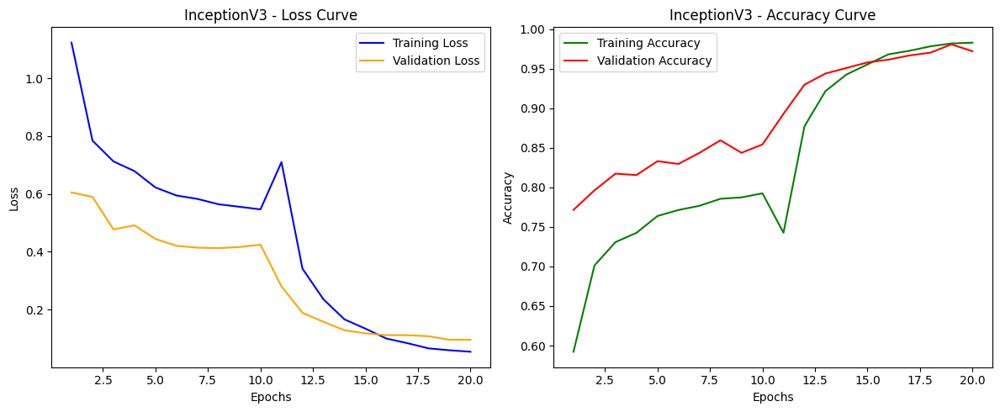

In [ ]:
import matplotlib.pyplot as plt

# epochs across both phases
epochs = range(1, len(history['loss']) + 1)

plt.figure(figsize=(12, 5))

# plotting the loss
plt.subplot(1, 2, 1)
plt.plot(epochs, history['loss'], label='Training Loss', color='blue')
plt.plot(epochs, history['val_loss'], label='Validation Loss', color='orange')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('InceptionV3 - Loss Curve')
plt.legend()

# plotting the accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, history['accuracy'], label='Training Accuracy', color='green')
plt.plot(epochs, history['val_accuracy'], label='Validation Accuracy', color='red')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('InceptionV3 - Accuracy Curve')
plt.legend()

plt.tight_layout()
plt.savefig('inceptionv3_training_curves.png') 
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


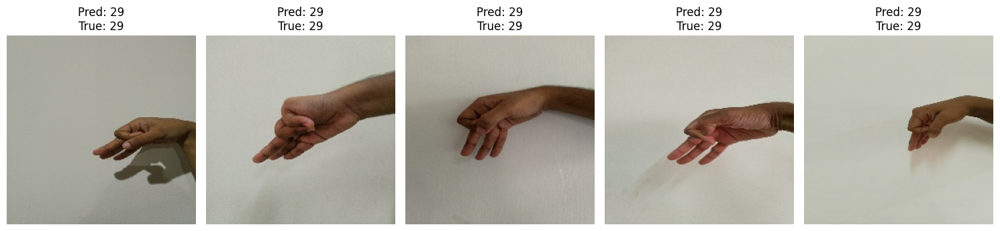

In [ ]:
sample_images, sample_labels = next(test_generator)

# predict
sample_predictions = model.predict(sample_images)
sample_pred_labels = np.argmax(sample_predictions, axis=1)
class_names = list(test_generator.class_indices.keys())

# plotting predictions
plt.figure(figsize=(15, 5))
for i in range(5):  # 5 random samples from the current batch
    plt.subplot(1, 5, i + 1)
    plt.imshow(sample_images[i])
    plt.title(f"Pred: {class_names[sample_pred_labels[i]]}\nTrue: {class_names[int(sample_labels[i])]}")
    plt.axis('off')

plt.tight_layout()
plt.savefig('inceptionv3_sample_predictions.png')
plt.show()
plt.close()



Running inference on sample test images...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


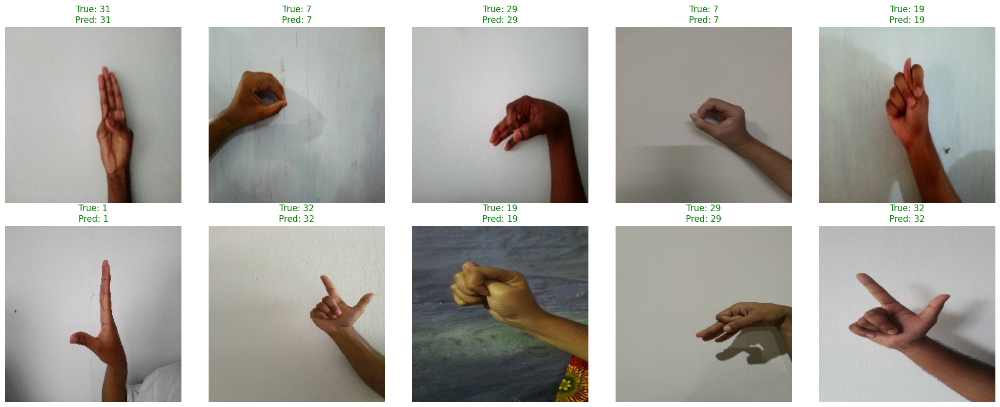

In [85]:
# running inference visualization
visualize(model, test_generator, class_labels, num_images=10, save_path='inception_inference.png')